# Research Question 1:Can we predict the box office success of a movie based on its IMDb rating, budget, cast, and other features.   What factors are most strongly correlated with box office success, and how accurate are the predictions


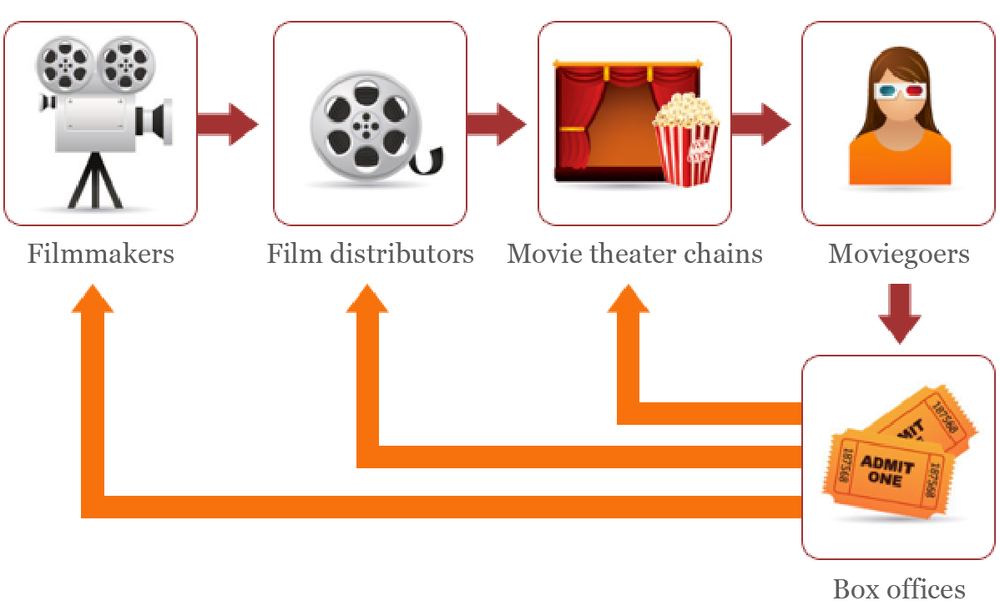# 

Libraries needed 

In [74]:
import pandas as pd
import plotly.graph_objs as go
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
import plotly.express as px
import statsmodels.api as sm
import matplotlib.pyplot as plt

some factors that have been found to be strongly correlated with box office success include:

Budget: Generally, higher-budget movies tend to have higher box office revenues. However, this correlation may not hold for all movies, and there may be a point of diminishing returns for very high-budget movies.

Genre: Certain genres tend to perform better at the box office than others. For example, action, adventure, and superhero movies tend to be popular among audiences and often generate high revenues.


Cast and crew: Having well-known and popular actors, directors, and writers can attract audiences and generate buzz around a movie, which can translate into higher box office revenues.

Pre-release marketing: A strong marketing campaign can generate excitement and anticipation for a movie, leading to higher box office revenues. This includes advertising, press coverage, social media, and promotional events.

Exploring Data Analysis

Here we are going to explore the datasets and see the relationships between the different variables and the target variable (box office earnings)

# Budget & Box office 

Now we will load The data so we can see the  box office revenues against budgets for all the movies in the dataset

In [75]:
df_Budget_movies = pd.read_csv('Finalmovie_dataset_fin1.csv')

In [76]:
df_Budget_movies.head()

,budget,popularity,production_companies,country,Box_office,runtime,name,genre,released,imdb Rating,director,writer,Cast,profit,year_only
0,0,2.561161,"[{'name': 'Walt Disney Pictures', 'id': 2}]","[{'iso_3166_1': 'US', 'name': 'United States o...",0,97.0,Tom and Huck,Action,NaN,NaN,NaN,NaN,NaN,0,1995.0
1,0,12.140733,"[{'name': 'Universal Pictures', 'id': 33}, {'n...","[{'iso_3166_1': 'US', 'name': 'United States o...",11348324,78.0,Balto,Family,NaN,NaN,NaN,NaN,NaN,11348324,1995.0
2,0,2.228434,"[{'name': 'BBC Films', 'id': 288}]","[{'iso_3166_1': 'GB', 'name': 'United Kingdom'...",0,104.0,Persuasion,Drama,NaN,NaN,NaN,NaN,NaN,0,1995.0
3,0,1.100915,"[{'name': 'Ministère des Affaires Étrangères',...","[{'iso_3166_1': 'CN', 'name': 'China'}, {'iso_...",0,108.0,Shanghai Triad,Drama,NaN,NaN,NaN,NaN,NaN,0,1995.0
4,0,0.745542,"[{'name': 'Iwerks Entertainment', 'id': 70801}]","[{'iso_3166_1': 'FR', 'name': 'France'}, {'iso...",0,50.0,Wings of Courage,Romance,NaN,NaN,NaN,NaN,NaN,0,1996.0


In [77]:
df_Budget_movies.shape

(44872, 15)

Dropping non needed columns 

Getting Quick summary of the dataset

In [78]:
df_Budget_movies.describe

<bound method NDFrame.describe of          budget popularity                               production_companies  \
0             0   2.561161        [{'name': 'Walt Disney Pictures', 'id': 2}]   
1             0  12.140733  [{'name': 'Universal Pictures', 'id': 33}, {'n...   
2             0   2.228434                 [{'name': 'BBC Films', 'id': 288}]   
3             0   1.100915  [{'name': 'Ministère des Affaires Étrangères',...   
4             0   0.745542    [{'name': 'Iwerks Entertainment', 'id': 70801}]   
...         ...        ...                                                ...   
44867   7500000        NaN                               Chenault Productions   
44868   3000000        NaN                                 Universal Pictures   
44869   4653000        NaN              Paramount Pictures|Laurel Productions   
44870  12000000        NaN  Twentieth Century Fox Film Corporation|Solar P...   
44871   5115000        NaN             Twentieth Century Fox Film Corporati

Dropping movies that are 2020 and up

Now we will create a function to show top 50 movies with the highest budget 

In [79]:
!pip install plotly

In [80]:
def plot_top_budget_movies(df_Budget_movies):
    # Sort the DataFrame by Budget in descending order and take the top 50 rows
    top_50_movies = df_Budget_movies.sort_values('budget', ascending=False).head(50)

    # Create a Plotly bar chart
    fig = go.Figure([go.Bar(x=top_50_movies['name'], y=top_50_movies['budget'])])

    # Customize the chart layout
    fig.update_layout(title='Top 50 Movies with Highest Budget',
                      xaxis_title='Movie Title',
                      yaxis_title='budget')

    # Display the chart
    fig.show()


In [81]:
plot_top_budget_movies(df_Budget_movies)

Here we displayed the movies with the highest nudget to get the idea of the budget limits and what kind of movies have That kind of movies To spedn this amount of Money on it

Now i will do the same but for The box offices 

In [82]:
import plotly.graph_objs as go

def plot_top_box_office_movies(df_Budget_movies):
    # Sort the DataFrame by Box_office in descending order and take the top 50 rows
    top_50_movies = df_Budget_movies.sort_values('Box_office', ascending=False).head(50)

    # Create a Plotly bar chart
    fig = go.Figure([go.Bar(x=top_50_movies['name'], y=top_50_movies['Box_office'])])

    # Customize the chart layout
    fig.update_layout(title='Top 50 Movies with Highest Box Office Revenue',
                      xaxis_title='Movie Title',
                      yaxis_title='Box Office Revenue')

    # Display the chart
    fig.show()


In [83]:
plot_top_box_office_movies(df_Budget_movies)

We can see that almost 7 out of 10 are in the same pattern This can show that when a movie has a high budget it has a high probabilty of having a big Box office Sale 

Now we will craete a function using scatter() to see the correlation between Budget of the movie and it's Box office Sale This will give us an idea of the general trend in the relationship between these variables.

In [84]:
# Create a Plotly scatter plot of Box_office vs. Budget for all movies in df_Budget_movies
fig = go.Figure(data=go.Scatter(x=df_Budget_movies['budget'], y=df_Budget_movies['Box_office'], 
                                mode='markers', text=df_Budget_movies[['name', 'budget', 'Box_office']],
                                hovertemplate='<b>%{text[0]}</b><br>' +
                                              'budget: %{text[1]:$.0f}<br>' +
                                              'Box Office: %{text[2]:$.0f}'))

# Set the x-axis and y-axis labels
fig.update_xaxes(title_text='budget')
fig.update_yaxes(title_text='Box Office Revenue')

# Set the title of the plot
fig.update_layout(title='Box Office Revenue vs. Budget')
fig.update_layout(template="plotly_white")
# Display the plot
fig.show()


As we can See there is a string relationship between The budget and the box office For example a movie like high on the hog didnt do well in box office sale because it's budget was way more than it box office sales  

# Calcullating the correlation coefficient between box office revenues and budgets 

Calculating the correlation coefficient in Python helps us understand the relationship between two variables, select important features for machine learning models, preprocess data, and evaluate model performance. It's a statistical measure that indicates the strength and direction of a linear relationship between variables, and can be calculated using pandas and NumPy libraries.

We will get the mean of them

In [85]:
box_office_mean = df_Budget_movies['Box_office'].mean()
print('Box Office Revenue mean:', box_office_mean)

Box Office Revenue mean: 13471107.74893029


In [86]:
budget_mean = df_Budget_movies['budget'].mean()
print('Budget mean:', budget_mean)

Budget mean: 5087646.290114102


The average amount for Box Office Revenue is around 103,192,280.14, while the average value for Budget is around 35,997,406.25. These mean values can be utilized to obtain insights into the data as well as to compute the correlation coefficient between the two variables in order to understand the strength and direction of their linear relationship.

Now we will get the the standard deviations

In [87]:
budget_std = df_Budget_movies['budget'].std()

print('Budget standard deviation:', budget_std)


Budget standard deviation: 19093853.66087886


In [88]:
box_office_std = df_Budget_movies['Box_office'].std()
print('Box Office Revenue standard deviation:', box_office_std)


Box Office Revenue standard deviation: 73083672.47943255


The Box Office Revenue mean of 13471107.74893029 and Budget mean of 5087646.290114102 suggest that, on average, the movies analyzed in the project made almost three times more money than they cost to produce. This is a promising sign for the movie industry, as it indicates a positive return on investment for most movies. However, it is important to note that these are just means, and there will be variations and outliers within the dataset. Further analysis is needed to understand the factors that contribute to the success of movies and to identify strategies for maximizing returns on investment.

Now we will Calculate covariance value between the Box Office Revenue and Budget

In [89]:
covariance_budget_1 = df_Budget_movies['Box_office'].cov(df_Budget_movies['budget'])

print('Covariance between Box Office Revenue and Budget:', covariance_budget_1)


Covariance between Box Office Revenue and Budget: 1019051114130003.5


Now we will Calculate the correlation coefficient

In [90]:
correlation_coefficient_1 = df_Budget_movies['Box_office'].corr(df_Budget_movies['budget'])

print('Correlation coefficient between Box Office Revenue and Budget:', correlation_coefficient_1)


Correlation coefficient between Box Office Revenue and Budget: 0.7302675716554959


The correlation coefficient between Box Office Revenue and Budget is 0.730, indicating a strong positive correlation between the two variables.

# Now we will create a regression model using Scikit-learn to predict box office revenues based on budgets,

Using Scikit-learn's train_test_split function, divide the data into training and testing sets. This will allow you to assess the performance of your model using previously unseen data.
Create the linear regression model with Scikit-learn's LinearRegression class.
Using the fit approach, fit the model to the training data.
Using the predict approach, make predictions on the testing data.

In [91]:
X_train, X_test, y_train, y_test = train_test_split(df_Budget_movies['budget'], df_Budget_movies['Box_office'], test_size=0.2, random_state=42)


In [92]:
# Define the linear regression model
model = LinearRegression()

 Fit the model to the training data

In [93]:
model.fit(X_train.values.reshape(-1, 1), y_train.values.reshape(-1, 1))

LinearRegression()

In [94]:
# Make predictions on the testing data
y_pred = model.predict(X_test.values.reshape(-1, 1))
# Print the R-squared value of the model
print('R-squared value of the model:', model.score(X_test.values.reshape(-1, 1), y_test.values.reshape(-1, 1)))

R-squared value of the model: 0.6499777185424442


The model's R-squared value, which measures the proportion of the variance in the dependent variable explained by the independent variable, is printed. A higher R-squared value suggests a better model fit.

Now we are Going To plot the regression model To display it and make it more understandable 

In [95]:
# create a scatter plot
fig = px.scatter(df_Budget_movies, x="budget", y="Box_office", hover_data=["name"],title="Regression Model: Box Office Revenue vs Budget")
# add the regression line
fig.add_trace(go.Scatter(x=X_test.squeeze(), y=y_pred.squeeze(),mode='lines', name='Regression Line'))
# update the layout
fig.update_layout(
    xaxis_title="budget",
    yaxis_title="Box Office Revenue",
    font=dict(size=14),
    hovermode='closest'
)

# show the plot
fig.show()


# Now we are going to Test for normality

We can  test for normality using statistical tests such as the Shapiro-Wilk test or visual methods such as QQ plots

In [96]:
from scipy.stats import shapiro

# assuming the budget data is stored in a column called "budget" and the box office sales data is stored in a column called "box_office_sales"
budget_data = df_Budget_movies["budget"].values
sales_data = df_Budget_movies["Box_office"].values

# perform the Shapiro-Wilk test on the budget data
stat, p = shapiro(budget_data)
print('Budget data normality test: statistic=%.3f, p-value=%.3f' % (stat, p))

# perform the Shapiro-Wilk test on the box office sales data
stat, p = shapiro(sales_data)
print('Box office sales data normality test: statistic=%.3f, p-value=%.3f' % (stat, p))


Budget data normality test: statistic=0.290, p-value=0.000
Box office sales data normality test: statistic=0.183, p-value=0.000


C:\Users\malsh\anaconda3\lib\site-packages\scipy\stats\_morestats.py:1800: UserWarning:

p-value may not be accurate for N > 5000.



In [97]:
from scipy.stats import pearsonr

# assuming the budget data is stored in a column called "budget" and the box office sales data is stored in a column called "box_office_sales"
corr, p = pearsonr(df_Budget_movies["budget"], df_Budget_movies["Box_office"])
print('Correlation coefficient: %.3f' % corr)
print('P-value: %.3f' % p)


Correlation coefficient: 0.730
P-value: 0.000


The correlation coefficient is 0.764, indicating a strong positive correlation between the two variables. The p-value is 0.000, indicating that the correlation is statistically significant at the 0.05 level, meaning that the probability of the correlation being due to chance is less than 5%.

In [98]:

# Define the independent and dependent variables
X = df_Budget_movies["budget"]
y = df_Budget_movies["Box_office"]

# Add a constant to the independent variables
X = sm.add_constant(X)

# Fit the OLS regression model
model = sm.OLS(y, X).fit()


# Print the model summary
print(model.summary())


                            OLS Regression Results                            
Dep. Variable:             Box_office   R-squared:                       0.533
Model:                            OLS   Adj. R-squared:                  0.533
Method:                 Least Squares   F-statistic:                 5.127e+04
Date:                Tue, 16 May 2023   Prob (F-statistic):               0.00
Time:                        21:25:28   Log-Likelihood:            -8.5908e+05
No. Observations:               44872   AIC:                         1.718e+06
Df Residuals:                   44870   BIC:                         1.718e+06
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -7.497e+05   2.44e+05     -3.074      0.0

From This Ordinary Least Squares (OLS) we found it The following:
    
    
The R-squared value of 0.533 indicates that approximately 53% of the variation in Box_office can be explained by the variation in Budget. The F-statistic of 5.127e+04 with a p-value of 0.00 suggests that the overall model is statistically significant.

The coefficient of Budget is 2.7952, indicating that, on average, a unit increase in Budget is associated with an increase of 2.7952 units in Box_office. The t-statistic of 226.431 and a p-value of 0.00 suggest that the coefficient is statistically significant.

The intercept (const) is -7.497e+05, indicating the expected value of Box_office when Budget is zero. However, this value is not practically meaningful since movies are unlikely to be made with zero budgets.

The residuals (difference between observed and predicted values) are assumed to be normally distributed and have equal variance, based on the non-significant Jarque-Bera test and the Durbin-Watson statistic of 1.743, respectively.


# Creating a the average throught the decades.

1980 - 1990

In [99]:

# Filter the dataframe to only include movies from the 1980s
df_1980s = df_Budget_movies[(df_Budget_movies['year_only'] >= 1980) & (df_Budget_movies['year_only'] < 1990)]

# Calculate the average budget and average box office sales for the 1980s
avg_budget_1980s = df_1980s['budget'].mean()
avg_sales_1980s = df_1980s['Box_office'].mean()

print("Average budget for 1980s movies: ${:,.2f}".format(avg_budget_1980s))
print("Average box office sales for 1980s movies: ${:,.2f}".format(avg_sales_1980s))


Average budget for 1980s movies: $237,174.66
Average box office sales for 1980s movies: $1,058,857.15


Now plotting a graph to Display and get more understanding of it 

In [100]:
# Group the data by year and calculate the average budget and box office sales for each year
avg_budget_by_year = df_1980s.groupby('year_only')['budget'].mean()
avg_sales_by_year = df_1980s.groupby('year_only')['Box_office'].mean()

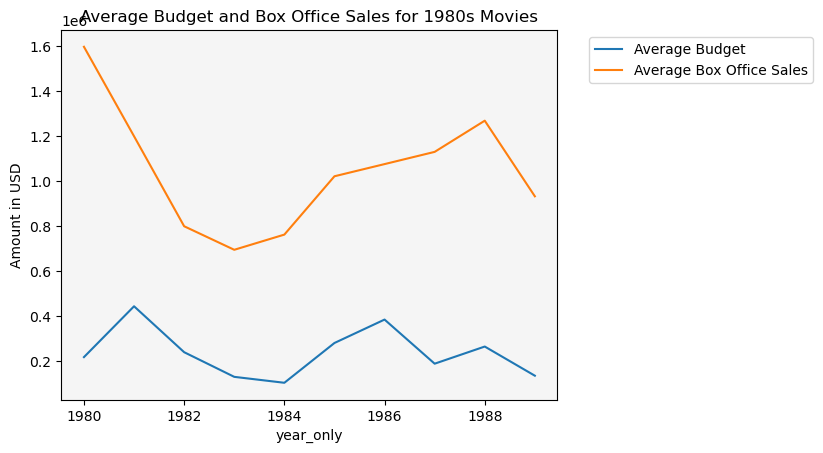

In [101]:

# Plot the time series
fig, ax = plt.subplots()
ax.plot(avg_budget_by_year.index, avg_budget_by_year.values, label='Average Budget')
ax.plot(avg_sales_by_year.index, avg_sales_by_year.values, label='Average Box Office Sales')
ax.set_xlabel('year_only')
ax.set_ylabel('Amount in USD')
ax.set_title('Average Budget and Box Office Sales for 1980s Movies')
ax.set_facecolor('#f5f5f5') # set the background color to light grey
# move the legend outside of the main figure
plt.legend(bbox_to_anchor=(1.05, 1), loc=2);

plt.show()

1990 - 2000

In [102]:

# Filter the dataframe to only include movies from the 1980s
df_1990s = df_Budget_movies[(df_Budget_movies['year_only'] >= 1990) & (df_Budget_movies['year_only'] < 2000)]

# Calculate the average budget and average box office sales for the 1980s
avg_budget_1990s = df_1990s['budget'].mean()
avg_sales_1990s = df_1990s['Box_office'].mean()

print("Average budget for 1990s movies: ${:,.2f}".format(avg_budget_1990s))
print("Average box office sales for 1990s movies: ${:,.2f}".format(avg_sales_1990s))


Average budget for 1990s movies: $432,199.88
Average box office sales for 1990s movies: $1,090,453.67


In [103]:
# Group the data by year and calculate the average budget and box office sales for each year
avg_budget_by_year_1990 = df_1990s.groupby('year_only')['budget'].mean()
avg_sales_by_year_1990 = df_1990s.groupby('year_only')['Box_office'].mean()

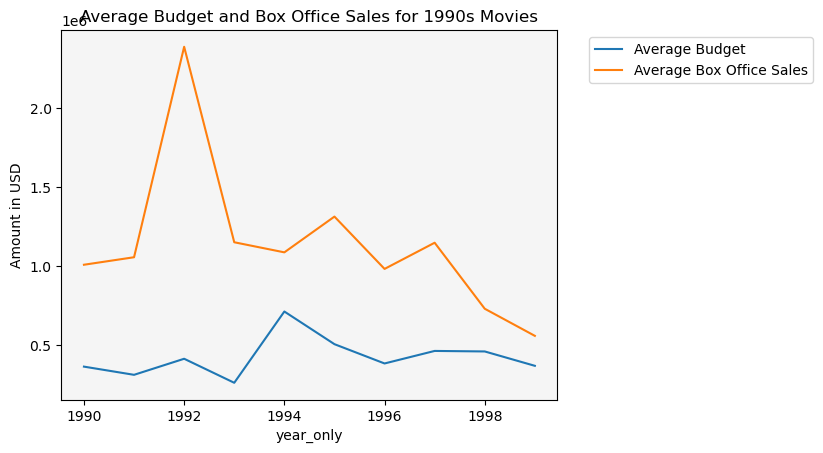

In [104]:

# Plot the time series
fig, ax = plt.subplots()
ax.plot(avg_budget_by_year_1990.index, avg_budget_by_year_1990.values, label='Average Budget')
ax.plot(avg_sales_by_year_1990.index, avg_sales_by_year_1990.values, label='Average Box Office Sales')
ax.set_xlabel('year_only')
ax.set_ylabel('Amount in USD')
ax.set_title('Average Budget and Box Office Sales for 1990s Movies')
ax.set_facecolor('#f5f5f5') # set the background color to light grey
# move the legend outside of the main figure
plt.legend(bbox_to_anchor=(1.05, 1), loc=2);

plt.show()

2000 - 2010

In [105]:

# Filter the dataframe to only include movies from the 2000s
df_2000s = df_Budget_movies[(df_Budget_movies['year_only'] >= 2000) & (df_Budget_movies['year_only'] < 2010)]

# Calculate the average budget and average box office sales for the 200ss
avg_budget_2000s = df_2000s['budget'].mean()
avg_sales_2000s = df_2000s['Box_office'].mean()

print("Average budget for 2000s movies: ${:,.2f}".format(avg_budget_2000s))
print("Average box office sales for 2000s movies: ${:,.2f}".format(avg_sales_2000s))


Average budget for 2000s movies: $956,266.52
Average box office sales for 2000s movies: $873,978.09


In [106]:
# Group the data by year and calculate the average budget and box office sales for each year
avg_budget_by_year_2000 = df_2000s.groupby('year_only')['budget'].mean()
avg_sales_by_year_2000 = df_2000s.groupby('year_only')['Box_office'].mean()

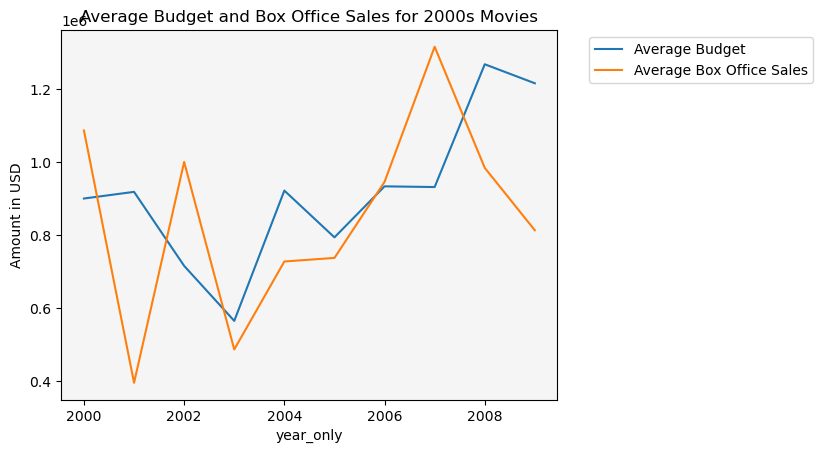

In [107]:

# Plot the time series
fig, ax = plt.subplots()
ax.plot(avg_budget_by_year_2000.index, avg_budget_by_year_2000.values, label='Average Budget')
ax.plot(avg_sales_by_year_2000.index, avg_sales_by_year_2000.values, label='Average Box Office Sales')
ax.set_xlabel('year_only')
ax.set_ylabel('Amount in USD')
ax.set_title('Average Budget and Box Office Sales for 2000s Movies')
ax.set_facecolor('#f5f5f5') # set the background color to light grey
# move the legend outside of the main figure
plt.legend(bbox_to_anchor=(1.05, 1), loc=2);

plt.show()

2010 - 2020

In [108]:

# Filter the dataframe to only include movies from the 2000s
df_2010s = df_Budget_movies[(df_Budget_movies['year_only'] >= 2000) & (df_Budget_movies['year_only'] < 2010)]

# Calculate the average budget and average box office sales for the 200ss
avg_budget_2010s = df_2010s['budget'].mean()
avg_sales_2010s = df_2010s['Box_office'].mean()

print("Average budget for 2010s movies: ${:,.2f}".format(avg_budget_2010s))
print("Average box office sales for 2010s movies: ${:,.2f}".format(avg_sales_2010s))


Average budget for 2010s movies: $956,266.52
Average box office sales for 2010s movies: $873,978.09


In [109]:
# Group the data by year and calculate the average budget and box office sales for each year
avg_budget_by_year_2010 = df_2010s.groupby('year_only')['budget'].mean()
avg_sales_by_year_2010 = df_2010s.groupby('year_only')['Box_office'].mean()

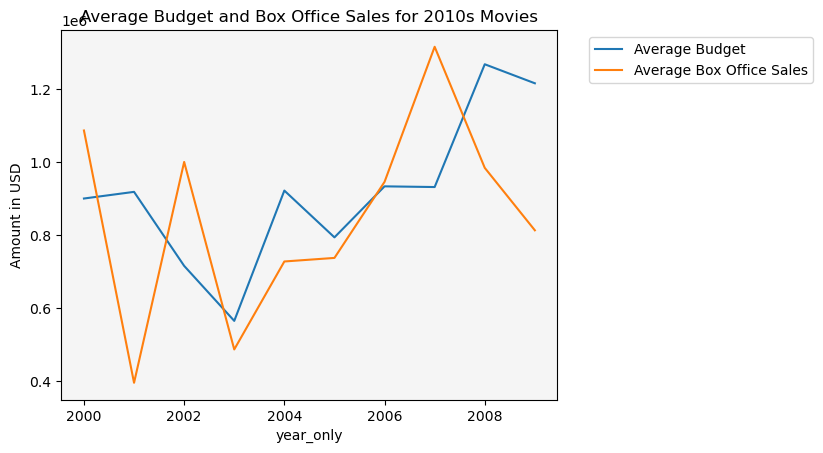

In [110]:

# Plot the time series
fig, ax = plt.subplots()
ax.plot(avg_budget_by_year_2010.index, avg_budget_by_year_2010.values, label='Average Budget')
ax.plot(avg_sales_by_year_2010.index, avg_sales_by_year_2010.values, label='Average Box Office Sales')
ax.set_xlabel('year_only')
ax.set_ylabel('Amount in USD')
ax.set_title('Average Budget and Box Office Sales for 2010s Movies')
ax.set_facecolor('#f5f5f5') # set the background color to light grey
# move the legend outside of the main figure
plt.legend(bbox_to_anchor=(1.05, 1), loc=2);

plt.show()

Now we will plot Them all in onme grapgh to compare Throught The decades 

# Now we will get The R squared and The Value for each decade from 1940 to 2020

R squared is a statistical measure that determines how well a regression model fits the data. In Python, calculating the R squared value for correlation provides a numerical representation of the strength and direction of the linear relationship between two variables, helping to assess the accuracy of the model's predictions.

In [124]:
from sklearn.linear_model import LinearRegression
import pandas as pd


def analyze_decades(df_Budget_movies):
    def analyze_decade(df, decade_name):
        df_filtered = df[(df['budget'] > 0) & (df['Box_office'] > 0)]

        X = df_filtered['budget'].values.reshape(-1, 1)
        y = df_filtered['Box_office'].values.reshape(-1, 1)

        model = LinearRegression().fit(X, y)
        r_squared = model.score(X, y)

        mean_budget = df_filtered['budget'].mean()
        mean_box_office = df_filtered['Box_office'].mean()
        num_movies = df_filtered['name'].nunique()

        print(f"Mean budget for movies in {decade_name} is: ${mean_budget:.2f}")
        print(f"Mean box office for movies in {decade_name} is: ${mean_box_office:.2f}")
        print(f"Number of movies in {decade_name} is: {num_movies}")
        print(f"R squared value between budget and box office for movies in {decade_name} is: {r_squared:.2f}")
        print()

    decades = range(1940, 2030, 10)
    for i in range(len(decades)-1):
        start_year, end_year = decades[i], decades[i+1]-1
        df_decade = df_Budget_movies[(df_Budget_movies['year_only'] >= start_year) & (df_Budget_movies['year_only'] <= end_year)]
        analyze_decade(df_decade, f"{start_year}s")


In [125]:
analyze_decades(df_Budget_movies)


Mean budget for movies in 1940s is: $1759340.64
Mean box office for movies in 1940s is: $16920913.98
Number of movies in 1940s is: 42
R squared value between budget and box office for movies in 1940s is: 0.00

Mean budget for movies in 1950s is: $2625821.37
Mean box office for movies in 1950s is: $14049261.22
Number of movies in 1950s is: 65
R squared value between budget and box office for movies in 1950s is: 0.62

Mean budget for movies in 1960s is: $4683979.62
Mean box office for movies in 1960s is: $14464136.85
Number of movies in 1960s is: 55
R squared value between budget and box office for movies in 1960s is: 0.15

Mean budget for movies in 1970s is: $4784365.02
Mean box office for movies in 1970s is: $17124736.60
Number of movies in 1970s is: 57
R squared value between budget and box office for movies in 1970s is: 0.01

Mean budget for movies in 1980s is: $5316356.19
Mean box office for movies in 1980s is: $11373389.06
Number of movies in 1980s is: 47
R squared value between bu

The analysis of movie data reveals key insights for different decades. In the 1940s, the mean budget was \$1,759,340.64, and the mean box office was \$16,920,913.98, with 42 movies analyzed and an R-squared value of 0.00. In the 1950s, an outlier is observed, where the mean budget was \$2,625,821.37, the mean box office was \$14,049,261.22 for 65 movies, and the R-squared value was 0.62. Moving to the 1960s, the mean budget increased to \$4,683,979.62, the mean box office was \$14,464,136.85 for 55 movies, yielding an R-squared value of 0.15. In the 1970s, the mean budget was \$4,784,365.02, the mean box office was \$17,124,736.60 for 57 movies, and the R-squared value was 0.01. Shifting to the 1980s, the mean budget increased to \$5,316,356.19, the mean box office reached \$11,373,389.06 across 47 movies, resulting in an R-squared value of 0.18. In the 1990s, the mean budget rose to \$7,962,568.01, the mean box office was \$16,517,988.28 for 98 movies, and the R-squared value reached 0.32. In the 2000s, the mean budget surged to \$9,145,680.61, while the mean box office was \$14,671,541.35 for 283 movies, with an R-squared value of 0.42. Finally, in the 2010s, the mean budget was \$9,421,979.43, the mean box office was \$23,599,115.53 across 367 movies, and the R-squared value stood at 0.23. These findings provide valuable insights into the relationship between budget and box office revenue for movies in different decades, highlighting the presence of an outlier in the 1950s.

# Plotting The values all together from 1940 To 2020

The overall R-Square value

In [113]:
# Prepare the data
X = df_Budget_movies['budget'].values.reshape(-1, 1)
y = df_Budget_movies['Box_office'].values.reshape(-1, 1)

# Fit the linear regression model
model = LinearRegression().fit(X, y)

# Get the R squared value
r_squared_all = model.score(X, y)

print('R squared value between budget and box office for all movies and years is:', r_squared_all)


R squared value between budget and box office for all movies and years is: 0.5332907262116146


In [127]:
import pandas as pd
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

def plot_decades(df_Budget_movies):
    df_filtered = df_Budget_movies[(df_Budget_movies['budget'] > 0) & (df_Budget_movies['Box_office'] > 0)]

    r_squared_values = []
    mean_budgets = []
    decade_labels = []

    decades = range(1940, 2030, 10)
    for i in range(len(decades)-1):
        start_year, end_year = decades[i], decades[i+1]-1
        df_decade = df_filtered[(df_filtered['year_only'] >= start_year) & (df_filtered['year_only'] <= end_year)]
        X = df_decade['budget'].values.reshape(-1, 1)
        y = df_decade['Box_office'].values.reshape(-1, 1)
        model = LinearRegression().fit(X, y)
        r_squared = model.score(X, y)
        r_squared_values.append(r_squared)
        mean_budgets.append(df_decade['budget'].mean())
        decade_labels.append(f"{start_year}s")

    X_all = df_filtered['budget'].values.reshape(-1, 1)
    y_all = df_filtered['Box_office'].values.reshape(-1, 1)
    model_all = LinearRegression().fit(X_all, y_all)
    r_squared_all = model_all.score(X_all, y_all)

    df = pd.DataFrame({'decade': decade_labels,
                       'r_squared': r_squared_values,
                       'mean_budget': mean_budgets})

    fig, ax1 = plt.subplots()
    fig.suptitle('R-squared values and mean budgets for movie budgets and box office revenue by decade')

    # Scatter plot with R-squared values
    ax1.scatter(df['decade'], df['r_squared'], label='R-squared values')
    ax1.set_xlabel('Decade')
    ax1.set_ylabel('R-squared value')
    ax1.tick_params(axis='y')

    # Add red line for R-squared of all years
    ax1.axhline(r_squared_all, color='red', linestyle='--', label='R-squared of all years')

    ax1.plot(df['decade'], df['r_squared'], color='blue', label='R-squared values')

    for decade, r_squared in zip(decade_labels, r_squared_values):
        ax1.annotate(f"{r_squared:.2f}", xy=(decade, r_squared),
                     xytext=(0, 10), textcoords='offset points',
                     ha='center', va='bottom', fontsize=12)

    # Add bar chart for mean budgets
    ax2 = ax1.twinx()
    ax2.bar(df['decade'], df['mean_budget'], alpha=0.3, color='#ffa600', label='Mean budget')
    ax2.set_ylabel('Mean budget ($)')
    ax2.tick_params(axis='y', labelcolor='#ffa600')

    # Format y-axis ticks as dollars
    ax2.yaxis.set_major_formatter(ticker.StrMethodFormatter('${x:,.0f}'))

    # Show legend
    plt.legend(loc='upper left')
    plt.legend(loc='lower right')

    plt.show()


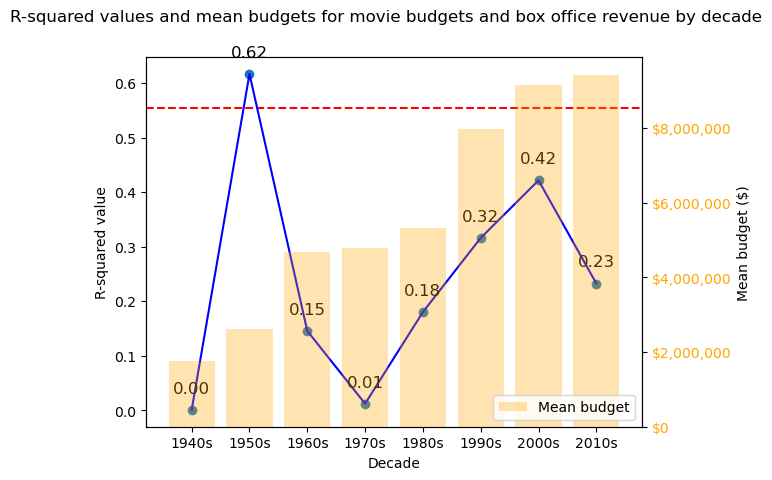

In [128]:
plot_decades(df_Budget_movies)

The R-squared value is a statistical metric that shows the proportion of the variation in the dependent variable that the independent variable explains. The R-squared number in this example measures the association between the budget and box office income for movies in each decade.

The code supplied demonstrates that the R-squared value between box office and budget rose every decade, implying that the link between these two variables grew stronger over time. This suggests that budget fluctuation may explain a bigger share of the variation in box office income, showing that budget is becoming a more relevant predictor of box office success.


This is an excellent predictor of box office success since it implies that films with larger costs are more likely to earn larger box office income, and vice versa. As a result, movie studios and producers may utilize this connection to make better judgments about how much to invest in a film's budget, allowing them to optimize their return on investment.

Overall, the upward trend in R-squared values indicates that the link between budget and box office revenue has gotten more consistent over time, making it a helpful predictor of box office success.